# Introduction

The assignment is focused on solving the Forest Cover Type Prediction: https://www.kaggle.com/c/forest-cover-type-prediction/overview. This task proposes a classification problem: predict the forest cover type (the predominant kind of tree cover) from strictly cartographic variables (as opposed to remotely sensed data).

The study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado. Each observation is a 30m x 30m patch. You are asked to predict an integer classification for the forest cover type. The seven types are:

1. Spruce/Fir
2. Lodgepole Pine
3. Ponderosa Pine
4. Cottonwood/Willow
5. Aspen
6. Douglas-fir
7. Krummholz

The training set (15120 observations) contains both features and the Cover_Type. The test set contains only the features. 

**You must predict the Cover_Type for every row in the test set (565892 observations).**

In [1]:
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
%matplotlib inline
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, Normalizer
from sklearn.preprocessing import PowerTransformer
import seaborn as sns
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.neighbors import LocalOutlierFactor
from sklearn.covariance import EllipticEnvelope
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score  # cross validate 
from sklearn.model_selection import train_test_split  # split between train and test 
from sklearn.pipeline import FeatureUnion, make_pipeline  # use all together in pipeline
from sklearn.linear_model import LogisticRegression # use logistic regression to predcit values 
from sklearn.preprocessing import label_binarize

#random forests 
from sklearn import tree, ensemble
from sklearn.metrics import (
    accuracy_score, 
    precision_score, 
    recall_score, 
    confusion_matrix,
    roc_curve,
    auc,
    roc_auc_score
)
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import GridSearchCV



#pd.set_option('display.max_columns',None)

In [2]:
pd.set_option('display.max_columns',None)

## 0.Data Import 

In [3]:
#load the training and testing dataset
train = pd.read_csv("train.csv")
test = pd.read_csv("test.csv")

In [4]:
test_1 = test.copy()

In [5]:
train.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


In [6]:
train

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,15116,2607,243,23,258,7,660,170,251,214,1282,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15116,15117,2603,121,19,633,195,618,249,221,91,1325,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15117,15118,2492,134,25,365,117,335,250,220,83,1187,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15118,15119,2487,167,28,218,101,242,229,237,119,932,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3


In [7]:
#create X and y
# X_old = train.iloc[:,:-1] 
X = train.iloc[:,1:-1] # drop the ID column
y = train.iloc[:,-1]

In [8]:
#Divide between numerical and categorical in order to scale only the numerical variables as the categorical ones are already dummy variables
X_num = X.iloc[:,:10]
X_cat = X.iloc[:,10:]
y.values

array([5, 5, 2, ..., 3, 3, 3], dtype=int64)

## 1. Data Exploration

In [9]:
 #it gives a report to try and understand the type of data we are using
report = ProfileReport(train, minimal=False)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

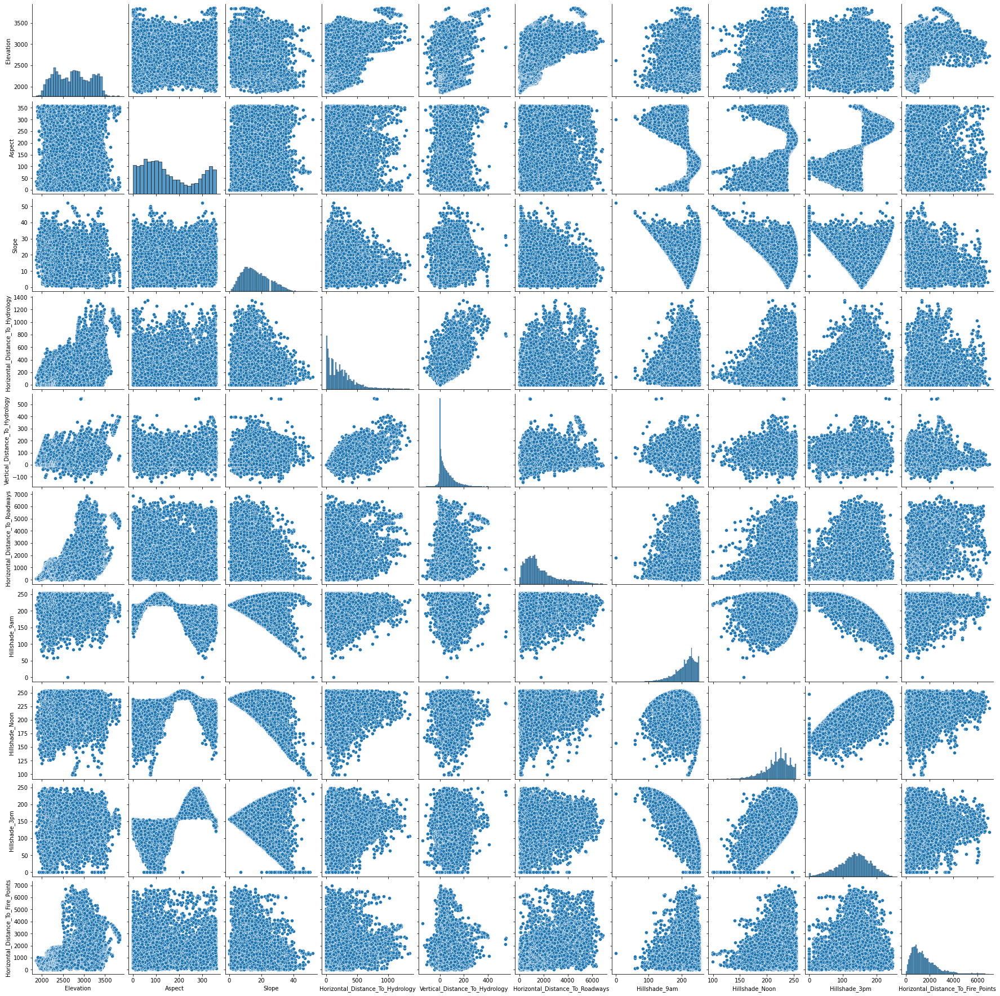

In [10]:
#Plot the non-categorical columns and check which distribution are skewed
cols_for_distrib = [
     "Elevation","Aspect", "Slope", "Horizontal_Distance_To_Hydrology","Vertical_Distance_To_Hydrology","Horizontal_Distance_To_Roadways","Hillshade_9am","Hillshade_Noon","Hillshade_3pm","Horizontal_Distance_To_Fire_Points"
 ]
sns.pairplot(train[cols_for_distrib])

In [11]:
#train_cat = train.loc[:,["Elevation","Aspect", "Slope", "Horizontal_Distance_To_Hydrology","Vertical_Distance_To_Hydrology","Horizontal_Distance_To_Roadways","Hillshade_9am","Hillshade_Noon","Hillshade_3pm","Horizontal_Distance_To_Fire_Points","Cover_Type"]]
#g = sns.PairGrid(train_cat, hue = "Cover_Type")
#g.map_diag(sns.histplot)
#g.map_offdiag(sns.scatterplot)
#g.add_legend()

In [12]:
train_temp = train.copy()
train_temp['Wilderness'] = (train_temp.iloc[:, 11:15] == 1).idxmax(1)
train_temp.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Wilderness
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,Wilderness_Area1
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,Wilderness_Area1
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,Wilderness_Area1
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,Wilderness_Area1
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,Wilderness_Area1


In [13]:
train_temp['Soil']= (train_temp.iloc[:, 15:55] == 1).idxmax(1)
train_temp.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Wilderness,Soil
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,Wilderness_Area1,Soil_Type29
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,Wilderness_Area1,Soil_Type29
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,Wilderness_Area1,Soil_Type12
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2,Wilderness_Area1,Soil_Type30
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5,Wilderness_Area1,Soil_Type29


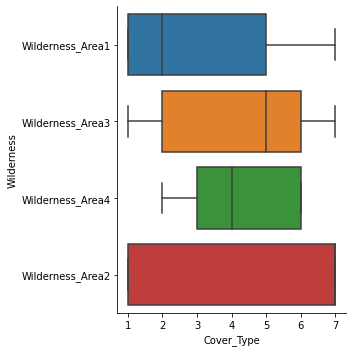

In [14]:
sns.catplot(x="Cover_Type", y="Wilderness",
            kind="box", data=train_temp)

In [15]:
#plot the density of each of the wilderness types for the cover types

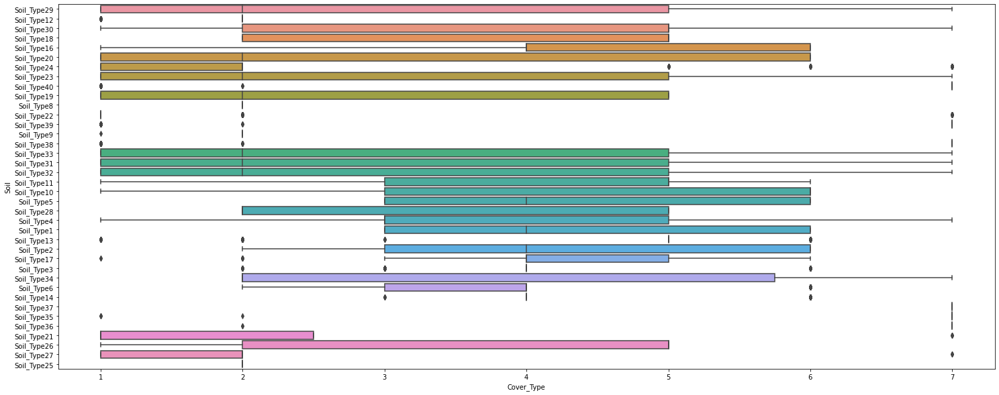

In [16]:
plt.figure(figsize=(25, 10))
ax = sns.boxplot(x=train_temp.Cover_Type, y=train_temp.Soil)
#ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
#sns.catplot(x="Cover_Type", y="Soil",  kind="box", data=train_temp)

(array([2160., 2160.,    0., 2160.,    0., 2160., 2160.,    0., 2160.,
        2160.]),
 array([1. , 1.6, 2.2, 2.8, 3.4, 4. , 4.6, 5.2, 5.8, 6.4, 7. ]),
 <BarContainer object of 10 artists>)

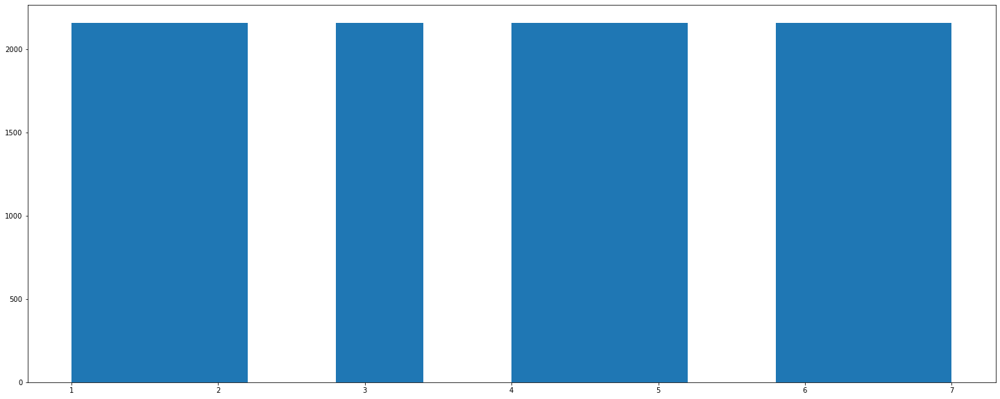

In [17]:
#plot how many times each cover_type occured
plt.figure(figsize=(25, 10))
plt.hist(x = train["Cover_Type"])

## 1.Data Cleaning (Outliers & Scaling)

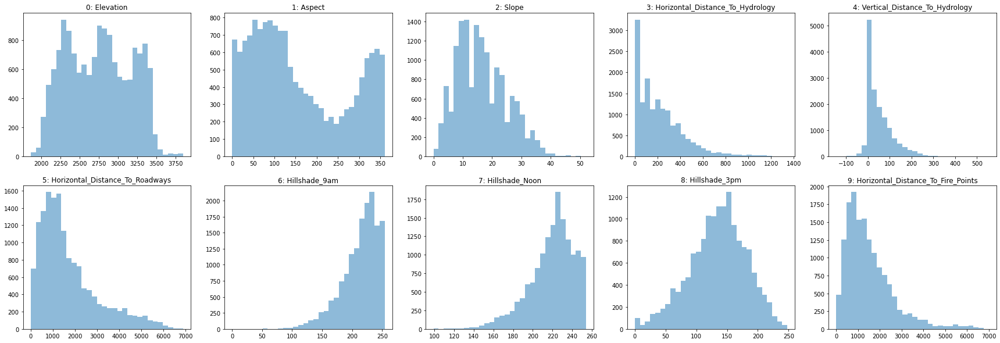

In [18]:
#data as is
fig, axes = plt.subplots(2, 5, figsize=(30, 10))
for i, ax in enumerate(axes.ravel()):
    if i > 9:
        ax.set_visible(False) #only plot the first 9 features
        continue
    ax.hist(X_num.values[:, i], bins=30
            , alpha=0.5)
    #x.set_xlim(X_num.values[:, i].min(), X_num.values[:, i].max())
    ax.set_title("{}: {}".format(i, X.columns[i]))

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X,y, random_state=5,test_size=.2)


In [20]:
def model_evaluation(X_train, X_test, y_train, y_test):
    random_state = 5
    rf = ensemble.RandomForestClassifier(random_state=random_state)  # without parameter turning
    rf.fit(X_train, y_train) # train the trees on the test data to get forest
    y_hat = rf.predict(X_test)
    # metrics from sklearn
    confusion_mtx = confusion_matrix(y_test, y_hat, labels=np.unique(y_train))
    accuracy = accuracy_score(y_test, y_hat)
    precision = precision_score(y_test, y_hat, average = 'macro')
    recall = recall_score(y_test, y_hat, average='macro')
    # print metrics
    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"Confusion matrix:") 
    print(confusion_mtx)


In [21]:
def evaluation(y_test,y_hat):
    # metrics from sklearn
    confusion_mtx = confusion_matrix(y_test, y_hat, labels=np.unique(y))
    accuracy = accuracy_score(y_test, y_hat)
    precision = precision_score(y_test, y_hat, average = 'macro')
    recall = recall_score(y_test, y_hat, average='macro')
    # print metrics
    print(f"Accuracy: {accuracy:.3f}")
    print(f"Precision: {precision:.3f}")
    print(f"Recall: {recall:.3f}")
    print(f"Confusion matrix:") 
    print(confusion_mtx)

### Data Cleaning: Outlier Handling 

## BM1

In [22]:
#Model Accuracy without outliers 
model_evaluation(X_train,X_test, y_train, y_test)

Accuracy: 0.869
Precision: 0.866
Recall: 0.868
Confusion matrix:
[[360  69   0   0   6   2  15]
 [ 71 298  10   0  23  13   5]
 [  0   3 341  23   0  59   0]
 [  0   0   6 397   0   5   0]
 [  0   8  11   0 415   4   0]
 [  0   1  39  11   1 363   0]
 [ 12   0   0   0   0   0 453]]


In [23]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score

random_state=5
initial_lm_mod = ensemble.RandomForestClassifier(random_state=random_state)
print("Baseline model with Accuracy = {:.4}".format(np.mean(cross_val_score(initial_lm_mod, X, y, cv=5))))

Baseline model with Accuracy = 0.7831


In [24]:
# use for loop to apply all the outlier handling methods on the data iteratively 
# runs very very long
X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(X,y, random_state=5, test_size=.1)

for outlier_detector in [IsolationForest(), EllipticEnvelope(), LocalOutlierFactor(), OneClassSVM()]:

    yhat = outlier_detector.fit_predict(X_train_t.values)
    mask = yhat != -1
    X_train_1, y_train_1 = X_train_t.values[mask, :], y_train_t.values[mask]  # filter data with our mask 
    model = RandomForestClassifier()
    model.fit(X_train_1, y_train_1)
    yhat_t = model.predict(X_test_t)
    print(f"{evaluation(y_test_t,yhat_t)} for {outlier_detector}, # of cut rows:{len(y_train_t)-len(y_train_1)}")
    

Accuracy: 0.866
Precision: 0.862
Recall: 0.865
Confusion matrix:
[[198  34   0   0   4   2  13]
 [ 32 139   5   0  12   2   4]
 [  0   1 163  11   2  28   0]
 [  0   0   5 201   0   2   0]
 [  0   5   4   0 196   3   0]
 [  0   0  26   4   0 186   0]
 [  4   0   0   0   0   0 226]]
None for IsolationForest(), # of cut rows:0


C:\Users\Chaouki\anaconda3\lib\site-packages\sklearn\covariance\_robust_covariance.py:647: UserWarning: The covariance matrix associated to your dataset is not full rank
  warnings.warn("The covariance matrix associated to your dataset "


Accuracy: 0.835
Precision: 0.836
Recall: 0.835
Confusion matrix:
[[200  32   0   0   4   2  13]
 [ 33 138   6   0  13   0   4]
 [  0   2 159  13   1  30   0]
 [  0   0   5 198   0   5   0]
 [  0  12   7   0 186   3   0]
 [  0   1  27   5   0 183   0]
 [ 31   0   0   0   0   0 199]]
None for EllipticEnvelope(), # of cut rows:1361
Accuracy: 0.870
Precision: 0.866
Recall: 0.868
Confusion matrix:
[[204  31   0   0   4   2  10]
 [ 26 141   4   0  15   3   5]
 [  0   1 163  13   1  27   0]
 [  0   0   5 201   0   2   0]
 [  0   6   5   0 194   3   0]
 [  0   0  25   5   0 186   0]
 [  3   1   0   0   0   0 226]]
None for LocalOutlierFactor(), # of cut rows:81
Accuracy: 0.766
Precision: 0.779
Recall: 0.764
Confusion matrix:
[[192  46   0   0   2   2   9]
 [ 39 129   5   0  19   2   0]
 [  0   1 128  21   1  54   0]
 [  0   0   4 201   0   3   0]
 [  6  50   4   0 146   2   0]
 [  0   0  23   7   0 186   0]
 [ 51   3   0   0   0   0 176]]
None for OneClassSVM(), # of cut rows:6804


In [25]:
#another method to remove outliers
def outlier_function(train, col_name):
    ''' this function detects first and third quartile and interquartile range for a given column of a dataframe
    then calculates upper and lower limits to determine outliers conservatively
    returns the number of lower and uper limit and number of outliers respectively
    '''
    first_quartile = np.percentile(np.array(train[col_name].tolist()), 25)
    third_quartile = np.percentile(np.array(train[col_name].tolist()), 75)
    IQR = third_quartile - first_quartile
                      
    upper_limit = third_quartile+(3*IQR)
    lower_limit = first_quartile-(3*IQR)
    outlier_count = 0
                      
    for value in train[col_name].tolist():
        if (value < lower_limit) | (value > upper_limit):
            outlier_count +=1
    return lower_limit, upper_limit, outlier_count

for x in cols_for_distrib:
    print(f"{x}: {outlier_function(X_train,x)[2]}")

Elevation: 0
Aspect: 0
Slope: 0
Horizontal_Distance_To_Hydrology: 48
Vertical_Distance_To_Hydrology: 40
Horizontal_Distance_To_Roadways: 3
Hillshade_9am: 6
Hillshade_Noon: 14
Hillshade_3pm: 0
Horizontal_Distance_To_Fire_Points: 117


In [26]:
def outlier_function_extraction(train, col_name):
    ''' this function detects first and third quartile and interquartile range for a given column of a dataframe
    then calculates upper and lower limits to determine outliers conservatively
    returns the number of lower and uper limit and number of outliers respectively
    '''
    first_quartile = np.percentile(np.array(train[col_name].tolist()), 25)
    third_quartile = np.percentile(np.array(train[col_name].tolist()), 75)
    IQR = third_quartile - first_quartile
    second_quartile = np.percentile(np.array(train[col_name].tolist()), 50)
                      
    upper_limit = third_quartile+(3*IQR)
    lower_limit = first_quartile-(3*IQR)
    outlier_count = 0
    outlier_values = []                
    for value in train[col_name].tolist():
        if (value < lower_limit) | (value > upper_limit):
            outlier_values.append(value)
    return outlier_values

for x in cols_for_distrib:
    print(f"{x} values outliers: {outlier_function_extraction(X_train, x)}")

Elevation values outliers: []
Aspect values outliers: []
Slope values outliers: []
Horizontal_Distance_To_Hydrology values outliers: [1318, 1104, 1149, 1140, 1183, 1124, 1343, 1260, 1140, 1106, 1165, 1184, 1148, 1154, 1179, 1172, 1199, 1129, 1134, 1115, 1140, 1170, 1213, 1100, 1140, 1128, 1131, 1154, 1106, 1218, 1188, 1099, 1124, 1129, 1189, 1260, 1294, 1138, 1201, 1261, 1170, 1114, 1173, 1154, 1124, 1154, 1159, 1179]
Vertical_Distance_To_Hydrology values outliers: [382, 342, 554, 338, 334, 411, 315, 319, 401, 328, 346, 316, 344, 317, 350, 397, 333, 395, 307, 356, 363, 368, 345, 369, 318, 547, 330, 309, 354, 397, 387, 327, 316, 374, 318, 393, 321, 547, 354, 403]
Horizontal_Distance_To_Roadways values outliers: [6811, 6836, 6890]
Hillshade_9am values outliers: [59, 59, 78, 58, 73, 65]
Hillshade_Noon values outliers: [113, 99, 113, 113, 99, 121, 103, 114, 99, 118, 116, 120, 111, 111]
Hillshade_3pm values outliers: []
Horizontal_Distance_To_Fire_Points values outliers: [6186, 5783, 5983, 

## remove outliers of the feature with the highest number of outliers

In [27]:
train_try = X_train.copy()
train_try["Cover_Type"] = y_train.copy()
train_try = train_try[(train_try['Horizontal_Distance_To_Fire_Points'] > outlier_function(train_try,'Horizontal_Distance_To_Fire_Points')[0]) &
              (train_try['Horizontal_Distance_To_Fire_Points'] < outlier_function(train_try,'Horizontal_Distance_To_Fire_Points')[1])]
train_try.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
10588,3139,129,7,212,61,150,231,236,137,2305,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
4553,2176,339,11,42,4,1214,196,224,167,1087,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
9394,3369,13,5,42,2,4599,215,229,151,4468,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7
3863,2132,353,15,0,0,1282,193,213,157,1362,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
1161,2686,41,9,90,12,108,221,221,134,2221,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


In [28]:
y_train_try = train_try.iloc[:,-1]
X_train_try = train_try.iloc[:,:-1]

In [29]:
model_evaluation(X_train_try, X_test, y_train_try, y_test)

Accuracy: 0.866
Precision: 0.863
Recall: 0.865
Confusion matrix:
[[363  66   0   0   4   2  17]
 [ 71 294  11   0  28  11   5]
 [  0   3 334  22   1  66   0]
 [  0   0   7 396   0   5   0]
 [  1   8   8   0 417   4   0]
 [  0   3  36  12   0 364   0]
 [ 14   0   0   0   0   0 451]]


## fill outliers with null then interpolate

In [30]:
train_try_2 = train_try.copy()

In [31]:
def replace_outlier_with_null(train):
    for x in cols_for_distrib:
        outliers = outlier_function_extraction(train, x)
        filters = train[x].isin(outliers)
        train[x].loc[filters] = None
    return train
replace_outlier_with_null(train_try_2)

C:\Users\Chaouki\anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
10588,3139.0,129.0,7.0,212.0,61.0,150.0,231.0,236.0,137.0,2305.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
4553,2176.0,339.0,11.0,42.0,4.0,1214.0,196.0,224.0,167.0,1087.0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
9394,3369.0,13.0,5.0,42.0,2.0,4599.0,215.0,229.0,151.0,4468.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,7
3863,2132.0,353.0,15.0,0.0,0.0,1282.0,193.0,213.0,157.0,1362.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
1161,2686.0,41.0,9.0,90.0,12.0,108.0,221.0,221.0,134.0,2221.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,2084.0,275.0,8.0,30.0,0.0,1256.0,199.0,242.0,182.0,541.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
9917,3034.0,27.0,11.0,234.0,7.0,1237.0,215.0,217.0,137.0,1727.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
4079,2161.0,74.0,8.0,0.0,0.0,1150.0,230.0,224.0,127.0,741.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
2254,1898.0,34.0,23.0,175.0,56.0,134.0,210.0,184.0,99.0,765.0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6


In [32]:
train_try_2.isnull().sum()

Elevation                              0
Aspect                                 0
Slope                                  0
Horizontal_Distance_To_Hydrology      48
Vertical_Distance_To_Hydrology        40
Horizontal_Distance_To_Roadways        4
Hillshade_9am                          6
Hillshade_Noon                        14
Hillshade_3pm                          0
Horizontal_Distance_To_Fire_Points    17
Wilderness_Area1                       0
Wilderness_Area2                       0
Wilderness_Area3                       0
Wilderness_Area4                       0
Soil_Type1                             0
Soil_Type2                             0
Soil_Type3                             0
Soil_Type4                             0
Soil_Type5                             0
Soil_Type6                             0
Soil_Type7                             0
Soil_Type8                             0
Soil_Type9                             0
Soil_Type10                            0
Soil_Type11     

In [33]:
train_try_2 = train_try_2.interpolate()
train_try_2.isna().sum()

Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0
Soil_Type11                           0


In [34]:
#create X and y
# X_old = train.iloc[:,:-1] 
X_train_try_2 = train_try_2.iloc[:,:-1] # drop the ID column
y_train_try_2 = train_try_2.iloc[:,-1]

In [35]:
model_evaluation(X_train_try_2,X_test,y_train_try_2,y_test)

Accuracy: 0.866
Precision: 0.863
Recall: 0.865
Confusion matrix:
[[356  72   0   0   3   2  19]
 [ 67 297  12   0  28  11   5]
 [  0   2 344  21   0  59   0]
 [  0   0   8 395   0   5   0]
 [  1  11  10   0 411   5   0]
 [  0   2  39  11   1 362   0]
 [ 11   0   0   0   0   0 454]]


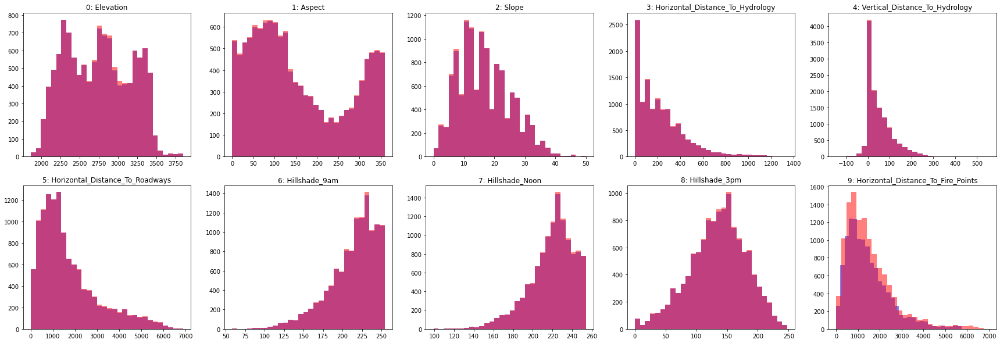

In [36]:
# plot the data after outlier handling 
fig, axes = plt.subplots(2, 5, figsize=(30, 10))
for i, ax in enumerate(axes.ravel()):
    if i > 9:
        ax.set_visible(False) #only plot the first 16 features
        continue
    ax.hist(X_train_try.values[:, i], bins=30, alpha=0.5, color = 'b')
    ax.set_title("{}: {}".format(i, X.columns[i]))
    

for i, ax in enumerate(axes.ravel()):
    if i > 9:
        ax.set_visible(False) #only plot the first 16 features
        continue
    ax.hist(X_train.values[:, i], bins=30, alpha=0.5, color = 'r')
    ax.set_title("{}: {}".format(i, X.columns[i]))

### Data Cleaning: Fixing distributions 

C:\Users\Chaouki\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3237: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


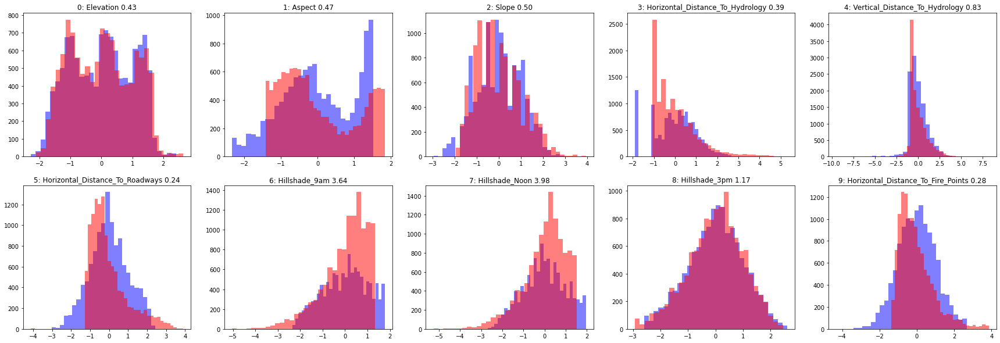

In [37]:
# apply the scaling methods - maybe not now 

scaler_comp = StandardScaler()
scaler_comp.fit(X_train)
X_train_scale = scaler_comp.transform(X_train_try)
X_test_scale = scaler_comp.transform(X_test)


from sklearn.preprocessing import PowerTransformer
fig, axes = plt.subplots(2, 5, figsize=(30, 10))
pt = PowerTransformer() 
X_train_scale_pt = pt.fit_transform(X_train_try)
X_test_scale_pt = pt.transform(X_test)

for i, ax in enumerate(axes.ravel()):
    if i > 9:
        ax.set_visible(False)
        continue
    ax.hist(X_train_scale_pt[:, i], bins=30, alpha = 0.5, color = 'b')
    ax.set_title("{}: {} {:.2f}".format(i, X.columns[i], pt.lambdas_[i]))
    
for i, ax in enumerate(axes.ravel()):
    if i > 9:
        ax.set_visible(False)
        continue
    ax.hist(X_train_scale[:, i], bins=30, alpha = 0.5, color = 'r')
    ax.set_title("{}: {} {:.2f}".format(i, X.columns[i], pt.lambdas_[i]))

#for i, ax in enumerate(axes.ravel()):
#    if i > 9:
#        ax.set_visible(False)
#        continue
#    ax.hist(X_train_try.values[:, i], bins=30, alpha = 0.5, color = 'g')
#    ax.set_title("{}: {} {:.2f}".format(i, X.columns[i], pt.lambdas_[i]))

## standard scaler

In [38]:
model_evaluation(X_train_scale,X_test_scale,y_train_try,y_test)

Accuracy: 0.865
Precision: 0.863
Recall: 0.865
Confusion matrix:
[[362  67   0   0   4   2  17]
 [ 70 295  10   0  28  12   5]
 [  0   3 332  21   1  69   0]
 [  0   0   6 397   0   5   0]
 [  1   8   8   0 417   4   0]
 [  0   3  37  12   0 363   0]
 [ 14   0   0   0   0   0 451]]


## using the power transformer

In [39]:
model_evaluation(X_train_scale_pt,X_test_scale_pt,y_train_try,y_test)

Accuracy: 0.865
Precision: 0.862
Recall: 0.864
Confusion matrix:
[[364  65   0   0   4   2  17]
 [ 73 291  11   0  29  11   5]
 [  0   3 335  21   1  66   0]
 [  0   0   7 395   0   6   0]
 [  1   9   8   0 416   4   0]
 [  0   3  37  12   0 363   0]
 [ 14   0   0   0   0   0 451]]


## 2. Feature Engineering 

In [40]:
model_evaluation(X_train_try, X_test, y_train_try, y_test)

Accuracy: 0.866
Precision: 0.863
Recall: 0.865
Confusion matrix:
[[363  66   0   0   4   2  17]
 [ 71 294  11   0  28  11   5]
 [  0   3 334  22   1  66   0]
 [  0   0   7 396   0   5   0]
 [  1   8   8   0 417   4   0]
 [  0   3  36  12   0 364   0]
 [ 14   0   0   0   0   0 451]]


## Correlation Matrix

<AxesSubplot:>

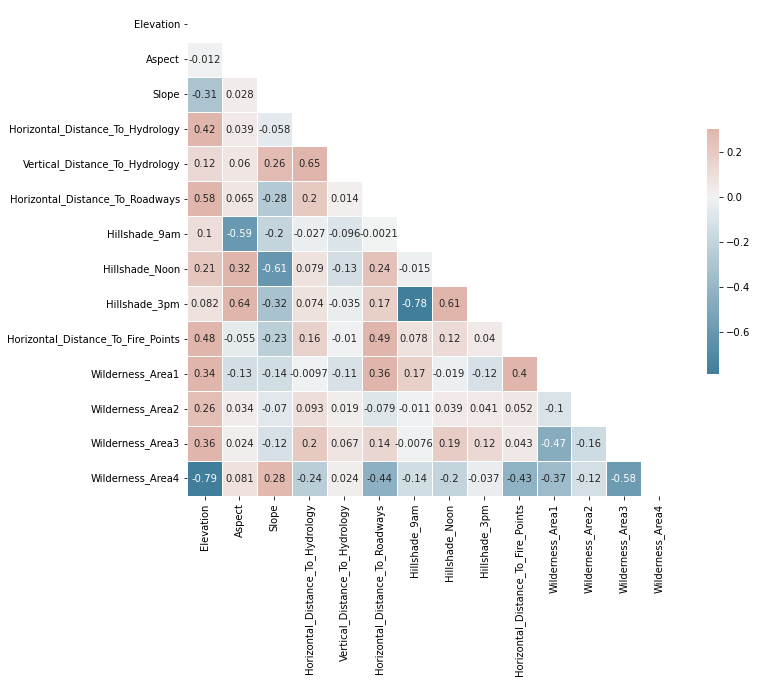

In [41]:
#Check correlation between vairables in X_train_try
from string import ascii_letters

# Compute the correlation matrix
    A
corr = pd.DataFrame(X_train_try.iloc[:,:14]).corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))


# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})



In [42]:
c = X_train_try.corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort", ascending=False)
so = pd.DataFrame(so, columns=["element1"])
so = so[so.loc[:,"element1"] != 1]
#pd.set_option('display.max_rows')
so

element1
Elevation                      Wilderness_Area4                  0.785074
Wilderness_Area4               Elevation                         0.785074
Hillshade_9am                  Hillshade_3pm                     0.781595
Hillshade_3pm                  Hillshade_9am                     0.781595
Vertical_Distance_To_Hydrology Horizontal_Distance_To_Hydrology  0.650511
...                                                                   ...
Soil_Type38                    Soil_Type15                            NaN
Soil_Type39                    Soil_Type7                             NaN
                               Soil_Type15                            NaN
Soil_Type40                    Soil_Type7                             NaN
                               Soil_Type15                            NaN

[2864 rows x 1 columns]

## Dropping Hillshade_9am

In [43]:
X_train_try_dr = X_train_try.copy()
del X_train_try_dr["Hillshade_9am"]
X_train_try_dr.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
10588,3139,129,7,212,61,150,236,137,2305,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4553,2176,339,11,42,4,1214,224,167,1087,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9394,3369,13,5,42,2,4599,229,151,4468,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3863,2132,353,15,0,0,1282,213,157,1362,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1161,2686,41,9,90,12,108,221,134,2221,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [44]:
X_test_dr = X_test.copy()
del X_test_dr["Hillshade_9am"]
X_test_dr.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
3950,2212,331,28,218,91,1020,193,182,1237,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12201,2029,8,31,95,64,127,162,118,108,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12182,2160,148,8,212,96,514,240,141,1033,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2514,2132,15,25,30,6,424,180,119,446,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
33,2516,23,6,150,4,658,227,147,5541,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [45]:
model_evaluation(X_train_try_dr, X_test_dr, y_train_try, y_test)

Accuracy: 0.878
Precision: 0.876
Recall: 0.877
Confusion matrix:
[[368  64   0   0   5   2  13]
 [ 68 300  11   0  26  11   4]
 [  0   2 353  19   1  51   0]
 [  0   0   9 397   0   2   0]
 [  0  10   9   0 414   5   0]
 [  0   1  28  13   1 372   0]
 [ 14   0   0   0   0   0 451]]


## Dropping WildernessArea4

In [46]:
X_train_try_dr_2 = X_train_try_dr.copy()
del X_train_try_dr_2["Wilderness_Area4"]
X_train_try_dr_2.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
10588,3139,129,7,212,61,150,236,137,2305,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4553,2176,339,11,42,4,1214,224,167,1087,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9394,3369,13,5,42,2,4599,229,151,4468,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3863,2132,353,15,0,0,1282,213,157,1362,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1161,2686,41,9,90,12,108,221,134,2221,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [47]:
X_test_dr_2 = X_test_dr.copy()
del X_test_dr_2["Wilderness_Area4"]
X_test_dr_2.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
3950,2212,331,28,218,91,1020,193,182,1237,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12201,2029,8,31,95,64,127,162,118,108,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12182,2160,148,8,212,96,514,240,141,1033,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2514,2132,15,25,30,6,424,180,119,446,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
33,2516,23,6,150,4,658,227,147,5541,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [48]:
model_evaluation(X_train_try_dr_2, X_test_dr_2, y_train_try, y_test)

Accuracy: 0.870
Precision: 0.867
Recall: 0.869
Confusion matrix:
[[357  72   0   0   5   2  16]
 [ 71 295   9   0  29  11   5]
 [  0   2 348  19   1  56   0]
 [  0   0  10 394   0   4   0]
 [  0  10   9   0 412   7   0]
 [  0   1  28  13   1 372   0]
 [ 13   0   0   0   0   0 452]]


<AxesSubplot:>

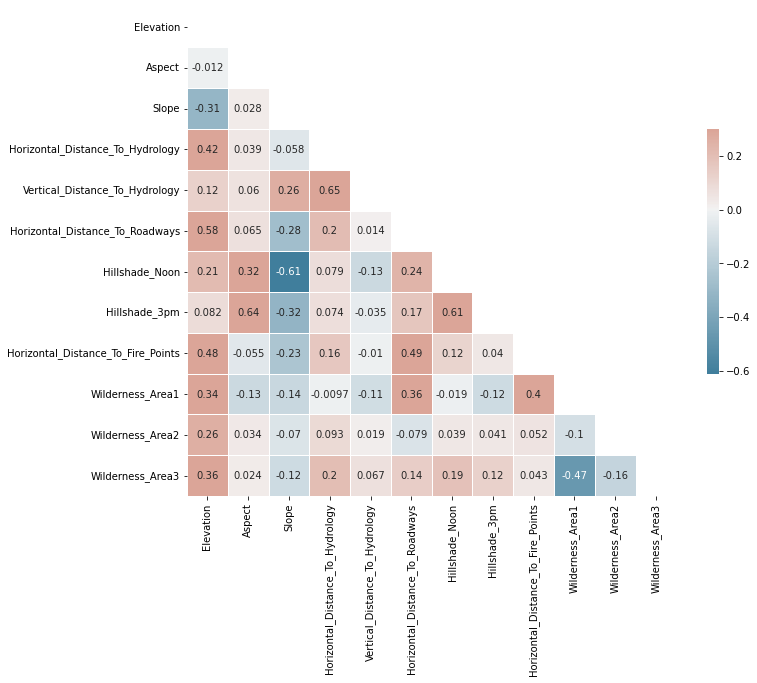

In [49]:
#Check correlation between vairables in X_train_try
from string import ascii_letters

# Compute the correlation matrix
    
corr = pd.DataFrame(X_train_try_dr_2.iloc[:,:12]).corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))


# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [50]:
c = X_train_try_dr_2.corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort", ascending=False)
so = pd.DataFrame(so, columns=["element1"])
so = so[so.loc[:,"element1"] != 1]
#pd.set_option('display.max_rows',None)
so

element1
Horizontal_Distance_To_Hydrology Vertical_Distance_To_Hydrology    0.650511
Vertical_Distance_To_Hydrology   Horizontal_Distance_To_Hydrology  0.650511
Aspect                           Hillshade_3pm                     0.635459
Hillshade_3pm                    Aspect                            0.635459
Hillshade_Noon                   Hillshade_3pm                     0.613717
...                                                                     ...
Soil_Type38                      Soil_Type15                            NaN
Soil_Type39                      Soil_Type7                             NaN
                                 Soil_Type15                            NaN
Soil_Type40                      Soil_Type7                             NaN
                                 Soil_Type15                            NaN

[2654 rows x 1 columns]

## Creating a new feature Euclidian_Distance_To_Hydrology

In [92]:
X_train_try_dr_ft = X_train_try_dr.copy()
X_train_try_dr_ft["Euclidian_Distance_To_Hydrology"] = np.sqrt(np.square(X_train_try_dr["Horizontal_Distance_To_Hydrology"]-X_train_try_dr["Vertical_Distance_To_Hydrology"]))
X_train_try_dr_ft.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Euclidian_Distance_To_Hydrology
10588,3139,129,7,212,61,150,236,137,2305,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,151.0
4553,2176,339,11,42,4,1214,224,167,1087,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,38.0
9394,3369,13,5,42,2,4599,229,151,4468,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,40.0
3863,2132,353,15,0,0,1282,213,157,1362,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0
1161,2686,41,9,90,12,108,221,134,2221,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,78.0


In [93]:
X_test_dr_ft = X_test_dr.copy()
X_test_dr_ft["Euclidian_Distance_To_Hydrology"] = np.sqrt(np.square(X_test_dr["Horizontal_Distance_To_Hydrology"]-X_test_dr["Vertical_Distance_To_Hydrology"]))
X_test_dr_ft.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Euclidian_Distance_To_Hydrology
3950,2212,331,28,218,91,1020,193,182,1237,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,127.0
12201,2029,8,31,95,64,127,162,118,108,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,31.0
12182,2160,148,8,212,96,514,240,141,1033,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,116.0
2514,2132,15,25,30,6,424,180,119,446,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.0
33,2516,23,6,150,4,658,227,147,5541,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,146.0


<AxesSubplot:>

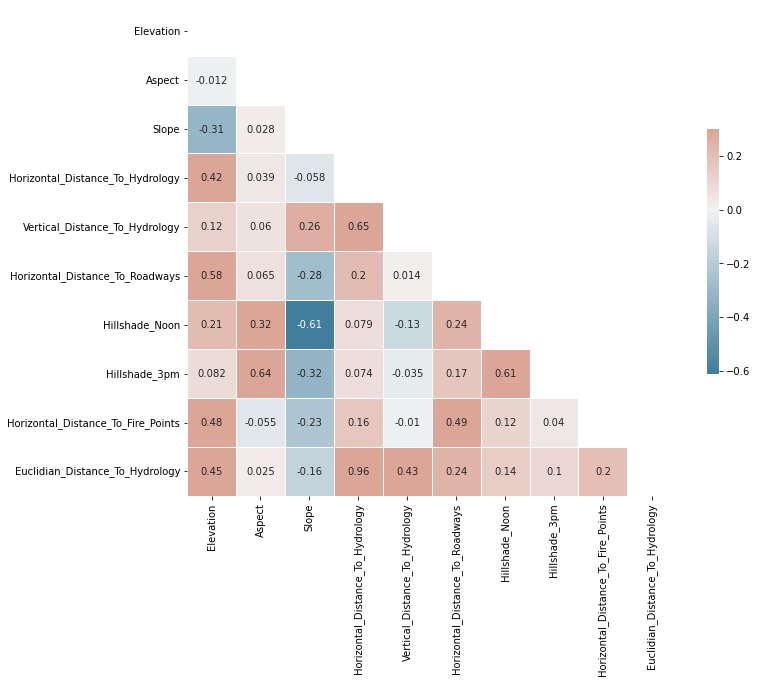

In [94]:
#Check correlation between vairables in X_train_try
from string import ascii_letters

# Compute the correlation matrix
    
corr = pd.DataFrame(X_train_try_dr_ft.loc[:,["Elevation","Aspect", "Slope", "Horizontal_Distance_To_Hydrology","Vertical_Distance_To_Hydrology","Horizontal_Distance_To_Roadways","Hillshade_Noon","Hillshade_3pm","Horizontal_Distance_To_Fire_Points","Euclidian_Distance_To_Hydrology"
 ]]).corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))


# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [96]:
del X_train_try_dr_ft["Horizontal_Distance_To_Hydrology"]

In [97]:
del X_test_dr_ft["Horizontal_Distance_To_Hydrology"]
X_test_dr_2_ft.head()

,Elevation,Aspect,Slope,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Euclidian_Distance_To_Hydrology
3950,2212,331,28,91,1020,193,182,1237,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,127.0
12201,2029,8,31,64,127,162,118,108,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,31.0
12182,2160,148,8,96,514,240,141,1033,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,116.0
2514,2132,15,25,6,424,180,119,446,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.0
33,2516,23,6,4,658,227,147,5541,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,146.0


In [98]:
model_evaluation(X_train_try_dr_ft, X_test_dr_ft, y_train_try, y_test)

Accuracy: 0.870
Precision: 0.868
Recall: 0.870
Confusion matrix:
[[363  66   0   0   5   2  16]
 [ 72 296   8   0  26  14   4]
 [  0   2 344  21   1  58   0]
 [  0   0   9 394   0   5   0]
 [  1   7  11   0 412   7   0]
 [  0   2  30  12   0 371   0]
 [ 13   0   0   0   0   0 452]]


## Target Encoding for Soil

In [99]:
X_train_try_dr.iloc[:,12:54]

,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
10588,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4553,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9394,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3863,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1161,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9917,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4079,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2254,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [58]:
def target_encode_multiclass(X_train,X_test,y_train,y_test): #X,y are pandas df and series
    from category_encoders import TargetEncoder, OneHotEncoder
    X_train["Soil_type"]=(X_train.iloc[:,12:54] == 1).idxmax(1)
    X_test["Soil_type"]=(X_test.iloc[:,12:54] == 1).idxmax(1)
    X_train = X_train.loc[:,["Elevation","Aspect","Slope","Horizontal_Distance_To_Hydrology","Vertical_Distance_To_Hydrology","Horizontal_Distance_To_Roadways","Hillshade_Noon","Hillshade_3pm","Horizontal_Distance_To_Fire_Points","Wilderness_Area1","Wilderness_Area2","Wilderness_Area3","Soil_type"]]
    X_test = X_test.loc[:,["Elevation","Aspect","Slope","Horizontal_Distance_To_Hydrology","Vertical_Distance_To_Hydrology","Horizontal_Distance_To_Roadways","Hillshade_Noon","Hillshade_3pm","Horizontal_Distance_To_Fire_Points","Wilderness_Area1","Wilderness_Area2","Wilderness_Area3","Soil_type"]]
    y_train=y_train.astype(str)#convert to string to onehot encode
    y_test=y_test.astype(str)
    enc=OneHotEncoder().fit(y_train)
    y_onehot_train=enc.transform(y_train)
    y_onehot_test=enc.transform(y_test)
    class_names=y_onehot_train.columns  #names of onehot encoded columns
    X_obj_train=X_train.select_dtypes('object')#separate categorical columns
    X_train = X_train.select_dtypes(exclude='object')
    X_obj_test=X_test.select_dtypes('object')#separate categorical columns
    X_test = X_test.select_dtypes(exclude='object')
    for class_ in class_names:
      
        enc=TargetEncoder()
        enc.fit(X_obj_train,y_onehot_train[class_]) #convert all categorical 
        temp=enc.transform(X_obj_train)       #columns for class_
        temp_test=enc.transform(X_obj_test)       #columns for class_
        temp.columns=[str(x)+'_'+str(class_) for x in temp.columns]
        temp_test.columns=[str(x)+'_'+str(class_) for x in temp_test.columns]
        X_train=pd.concat([X_train,temp],axis=1)    #add to original dataset
        X_test=pd.concat([X_test,temp_test],axis=1)    #add to original dataset
      
    return X_train,X_test

In [100]:
X_train_try_dr_tr = X_train_try_dr.copy()
X_test_dr_tr = X_test_dr.copy()

In [101]:
X_train_try_dr_tr_result = target_encode_multiclass(X_train_try_dr_tr,X_test_dr_tr,y_train_try,y_test)[0]

In [102]:
X_test_dr_tr_result = target_encode_multiclass(X_train_try_dr_tr,X_test_dr_tr,y_train_try,y_test)[1]

In [103]:
model_evaluation(X_train_try_dr_tr_result, X_test_dr_tr_result, y_train_try, y_test)

Accuracy: 0.859
Precision: 0.856
Recall: 0.858
Confusion matrix:
[[353  75   0   0   2   2  20]
 [ 69 294  11   0  29  12   5]
 [  0   2 339  26   1  58   0]
 [  0   0   7 396   0   5   0]
 [  1  13   9   0 410   5   0]
 [  0   1  41  18   0 355   0]
 [ 13   1   0   0   0   0 451]]


## Encode Soil into different categories based on description

## 0. Do categorical encoding to work on variables

In [104]:
def categorical_encoding(X):
    data = X.copy()
    data['Soil_Type'] = 0
    for i in range(1,41):
        data['Soil_Type'] += i*data[f'Soil_Type{i}']
    return data

In [105]:
X_train_cat = categorical_encoding(X_train_try_dr)

In [106]:
X_test_cat = categorical_encoding(X_test_dr)

In [107]:
X_train_cat.shape

(11979, 54)

## 1. Stony Level

In [108]:
def Stony_Level(X):
    
    # Group IDs
    no_value = [7,8,14,15,16,17,19,20,21,22,23,35]
    stony = [6,12]
    very_stony = [2,9,18,26]
    extremely_stony = [1,24,25,27,28,29,30,31,32,33,34,36,37,38,39,40]
    rubbly = [3,4,5,10,11,13]
    # Create dictionary
    stony_level = {x:0 for x in no_value}
    stony_level.update({x:1 for x in stony})
    stony_level.update({x:2 for x in very_stony})
    stony_level.update({x:3 for x in extremely_stony})
    stony_level.update({x:4 for x in rubbly})
    
    
    X_stony = X.copy()
    X_stony['Stony_Level'] = X['Soil_Type'].apply(
        lambda x: stony_level[x]
    )
    return X_stony

In [109]:
X_train_cat_stony = Stony_Level(X_train_cat)
X_test_cat_stony = Stony_Level(X_test_cat)

In [110]:
c = X_train_cat_stony.corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort", ascending=False)
so = pd.DataFrame(so, columns=["element1"])
so = so[so.loc[:,"element1"] != 1]
#pd.set_option('display.max_rows',None)
so

element1
Elevation                        Soil_Type                       0.828356
Soil_Type                        Elevation                       0.828356
Wilderness_Area4                 Elevation                       0.785074
Elevation                        Wilderness_Area4                0.785074
Horizontal_Distance_To_Hydrology Vertical_Distance_To_Hydrology  0.650511
...                                                                   ...
Soil_Type40                      Soil_Type15                          NaN
Soil_Type                        Soil_Type7                           NaN
                                 Soil_Type15                          NaN
Stony_Level                      Soil_Type7                           NaN
                                 Soil_Type15                          NaN

[2972 rows x 1 columns]

In [111]:
X_train_cat_stony_2 = X_train_cat_stony.copy()
X_test_cat_stony_2 = X_test_cat_stony.copy()

In [112]:
#Plot the non-categorical columns and check which distribution are skewed
X_train_cat_stony_2 = X_train_cat_stony_2.loc[:,["Elevation","Aspect", "Slope", "Horizontal_Distance_To_Hydrology","Vertical_Distance_To_Hydrology","Horizontal_Distance_To_Roadways","Hillshade_Noon","Hillshade_3pm","Horizontal_Distance_To_Fire_Points","Wilderness_Area1","Wilderness_Area2","Wilderness_Area3","Soil_Type","Stony_Level"]]
X_test_cat_stony_2 = X_test_cat_stony_2.loc[:,["Elevation","Aspect", "Slope", "Horizontal_Distance_To_Hydrology","Vertical_Distance_To_Hydrology","Horizontal_Distance_To_Roadways","Hillshade_Noon","Hillshade_3pm","Horizontal_Distance_To_Fire_Points","Wilderness_Area1","Wilderness_Area2","Wilderness_Area3","Soil_Type","Stony_Level"]]

In [113]:
model_evaluation(X_train_cat_stony_2, X_test_cat_stony_2, y_train_try, y_test)

Accuracy: 0.861
Precision: 0.858
Recall: 0.861
Confusion matrix:
[[349  76   0   0   3   2  22]
 [ 72 288  12   0  33  10   5]
 [  0   0 347  18   4  57   0]
 [  0   0   9 396   0   3   0]
 [  2  11  11   0 410   4   0]
 [  0   2  38  13   1 361   0]
 [ 11   0   0   0   0   0 454]]


## 2- Pop out Soil Type

In [114]:
X_train_cat_stony_tp = X_train_cat_stony.copy()
X_test_cat_stony_tp = X_test_cat_stony.copy()

In [115]:
X_train_cat_stony_tp.pop("Soil_Type")
X_train_cat_stony_tp.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Stony_Level
10588,3139,129,7,212,61,150,236,137,2305,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,3
4553,2176,339,11,42,4,1214,224,167,1087,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
9394,3369,13,5,42,2,4599,229,151,4468,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3863,2132,353,15,0,0,1282,213,157,1362,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1161,2686,41,9,90,12,108,221,134,2221,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3


In [116]:
X_test_cat_stony_tp.pop("Soil_Type")
X_test_cat_stony_tp.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Stony_Level
3950,2212,331,28,218,91,1020,193,182,1237,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
12201,2029,8,31,95,64,127,162,118,108,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
12182,2160,148,8,212,96,514,240,141,1033,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
2514,2132,15,25,30,6,424,180,119,446,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
33,2516,23,6,150,4,658,227,147,5541,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2


In [117]:
model_evaluation(X_train_cat_stony_tp, X_test_cat_stony_tp, y_train_try, y_test)

Accuracy: 0.871
Precision: 0.869
Recall: 0.871
Confusion matrix:
[[361  66   0   0   5   2  18]
 [ 68 299  13   0  27   9   4]
 [  0   3 348  20   1  54   0]
 [  0   0   8 396   0   4   0]
 [  1  10  10   0 412   5   0]
 [  0   2  35  12   0 366   0]
 [ 12   0   0   0   0   0 453]]


In [118]:
c = X_train_cat_stony_tp.corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort", ascending=False)
so = pd.DataFrame(so, columns=["element1"])
so = so[so.loc[:,"element1"] != 1]
#pd.set_option('display.max_rows',None)
so

element1
Wilderness_Area4                 Elevation                         0.785074
Elevation                        Wilderness_Area4                  0.785074
Vertical_Distance_To_Hydrology   Horizontal_Distance_To_Hydrology  0.650511
Horizontal_Distance_To_Hydrology Vertical_Distance_To_Hydrology    0.650511
Hillshade_3pm                    Aspect                            0.635459
...                                                                     ...
Soil_Type39                      Soil_Type15                            NaN
Soil_Type40                      Soil_Type7                             NaN
                                 Soil_Type15                            NaN
Stony_Level                      Soil_Type7                             NaN
                                 Soil_Type15                            NaN

[2864 rows x 1 columns]

## 3. Leighcan Family

In [119]:
def Leighcan_Family(X):
    
    # Group IDs
    no_Leighcan = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,26,29,30,32,34,35,36,37,39,40]
    Leighcan_Family = [22,23,24,25,27,28,31,33,38]
    # Create dictionary
    Leighcan = {x:0 for x in no_Leighcan}
    Leighcan.update({x:1 for x in Leighcan_Family})
    
    X_Leighcan = X.copy()
    X_Leighcan['Leighcan_Family'] = X['Soil_Type'].apply(
        lambda x: Leighcan[x]
    )
    return X_Leighcan

In [120]:
X_train_cat_stony_leig = Leighcan_Family(X_train_cat_stony)

In [121]:
X_test_cat_stony_leig = Leighcan_Family(X_test_cat_stony)

In [122]:
c = X_train_cat_stony_leig.corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort", ascending=False)
so = pd.DataFrame(so, columns=["element1"])
so = so[so.loc[:,"element1"] != 1]
#pd.set_option('display.max_rows',None)
so

element1
Elevation                      Soil_Type                         0.828356
Soil_Type                      Elevation                         0.828356
Elevation                      Wilderness_Area4                  0.785074
Wilderness_Area4               Elevation                         0.785074
Vertical_Distance_To_Hydrology Horizontal_Distance_To_Hydrology  0.650511
...                                                                   ...
Soil_Type                      Soil_Type15                            NaN
Stony_Level                    Soil_Type7                             NaN
                               Soil_Type15                            NaN
Leighcan_Family                Soil_Type7                             NaN
                               Soil_Type15                            NaN

[3082 rows x 1 columns]

In [123]:
X_test_cat_stony_leig.pop("Soil_Type")
X_test_cat_stony_leig.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Stony_Level,Leighcan_Family
3950,2212,331,28,218,91,1020,193,182,1237,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0
12201,2029,8,31,95,64,127,162,118,108,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0
12182,2160,148,8,212,96,514,240,141,1033,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0
2514,2132,15,25,30,6,424,180,119,446,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0
33,2516,23,6,150,4,658,227,147,5541,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0


In [124]:
X_train_cat_stony_leig.pop("Soil_Type")
X_train_cat_stony_leig.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Stony_Level,Leighcan_Family
10588,3139,129,7,212,61,150,236,137,2305,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,3,0
4553,2176,339,11,42,4,1214,224,167,1087,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0
9394,3369,13,5,42,2,4599,229,151,4468,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3863,2132,353,15,0,0,1282,213,157,1362,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1161,2686,41,9,90,12,108,221,134,2221,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0


In [126]:
model_evaluation(X_train_cat_stony_leig, X_test_cat_stony_leig, y_train_try, y_test)

Accuracy: 0.866
Precision: 0.864
Recall: 0.866
Confusion matrix:
[[355  75   0   0   3   2  17]
 [ 70 297   9   0  26  13   5]
 [  0   2 344  19   0  61   0]
 [  0   0   9 395   0   4   0]
 [  2  10  10   0 411   5   0]
 [  0   2  31  13   0 369   0]
 [ 16   1   0   0   0   0 448]]


## 4. Rock Size

In [127]:
def Rock_Size(X):
    
    # Group IDs
    no_value = [7,8,14,15,16,17,19,20,21,23,35]
    stones = [1,2,6,9,12,18,24,25,26,27,28,29,30,31,32,33,34,36,37,38,39,40]
    boulders = [22]
    rubble = [3,4,5,10,11,13]

    # Create dictionary
    rock_size = {x:0 for x in no_value}
    rock_size.update({x:1 for x in stones})
    rock_size.update({x:2 for x in boulders})
    rock_size.update({x:3 for x in rubble})
    
    X_rock = X.copy()
    X_rock['Rock_Size'] = X['Soil_Type'].apply(
        lambda x: rock_size[x]
    )
    return X_rock

In [128]:
X_train_cat_stony_size = Rock_Size(X_train_cat_stony)

In [129]:
X_test_cat_stony_size = Rock_Size(X_test_cat_stony)

In [130]:
c = X_train_cat_stony_leig.corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort", ascending=False)
so = pd.DataFrame(so, columns=["element1"])
so = so[so.loc[:,"element1"] != 1]
#pd.set_option('display.max_rows',None)
so

element1
Elevation                        Wilderness_Area4                  0.785074
Wilderness_Area4                 Elevation                         0.785074
Vertical_Distance_To_Hydrology   Horizontal_Distance_To_Hydrology  0.650511
Horizontal_Distance_To_Hydrology Vertical_Distance_To_Hydrology    0.650511
Aspect                           Hillshade_3pm                     0.635459
...                                                                     ...
Soil_Type40                      Soil_Type15                            NaN
Stony_Level                      Soil_Type7                             NaN
                                 Soil_Type15                            NaN
Leighcan_Family                  Soil_Type7                             NaN
                                 Soil_Type15                            NaN

[2972 rows x 1 columns]

In [131]:
X_test_cat_stony_size.pop("Soil_Type")
X_train_cat_stony_size.pop("Soil_Type")

10588    32
4553      4
9394     23
3863     17
1161     29
         ..
3046     17
9917     32
4079     17
2254      2
2915      6
Name: Soil_Type, Length: 11979, dtype: int64

In [132]:
model_evaluation(X_train_cat_stony_size, X_test_cat_stony_size, y_train_try, y_test)

Accuracy: 0.864
Precision: 0.861
Recall: 0.863
Confusion matrix:
[[357  72   0   0   4   2  17]
 [ 71 292  13   0  31   9   4]
 [  0   3 342  21   0  60   0]
 [  0   0   8 396   0   4   0]
 [  0  12  11   0 409   6   0]
 [  0   1  34  13   1 366   0]
 [ 14   0   0   0   0   0 451]]


## In Conclusion is that if we create Soil Type it is improving the model

## Try deleting soil types with least impact 

In [133]:
X_train_cat_stony_3 = X_train_cat_stony.copy()
X_test_cat_stony_3 = X_test_cat_stony.copy()

In [134]:
X_train_cat_stony_3.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Soil_Type,Stony_Level
10588,3139,129,7,212,61,150,236,137,2305,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,32,3
4553,2176,339,11,42,4,1214,224,167,1087,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,4
9394,3369,13,5,42,2,4599,229,151,4468,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,23,0
3863,2132,353,15,0,0,1282,213,157,1362,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0
1161,2686,41,9,90,12,108,221,134,2221,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3


In [135]:
del X_train_cat_stony_3["Soil_Type15"]
del X_test_cat_stony_3["Soil_Type15"]

In [136]:
X_test_cat_stony_3.pop("Soil_Type")
X_train_cat_stony_3.pop("Soil_Type")

10588    32
4553      4
9394     23
3863     17
1161     29
         ..
3046     17
9917     32
4079     17
2254      2
2915      6
Name: Soil_Type, Length: 11979, dtype: int64

In [137]:
model_evaluation(X_train_cat_stony_3, X_test_cat_stony_3, y_train_try, y_test)

Accuracy: 0.868
Precision: 0.865
Recall: 0.867
Confusion matrix:
[[358  73   0   0   3   3  15]
 [ 66 299  10   0  31  10   4]
 [  0   3 346  20   0  57   0]
 [  0   0  10 396   0   2   0]
 [  0  15  10   0 407   6   0]
 [  0   1  35  12   0 367   0]
 [ 14   0   0   0   0   0 451]]


[{'n_estimators':[20,30,100], 'max_depth':[5,10,15], 'max_features':[0.1,0.2,0.3]}] 

## Final Model 

In [138]:
model_evaluation(X_train_cat_stony_tp, X_test_cat_stony_tp, y_train_try, y_test)

Accuracy: 0.871
Precision: 0.869
Recall: 0.871
Confusion matrix:
[[361  66   0   0   5   2  18]
 [ 68 299  13   0  27   9   4]
 [  0   3 348  20   1  54   0]
 [  0   0   8 396   0   4   0]
 [  1  10  10   0 412   5   0]
 [  0   2  35  12   0 366   0]
 [ 12   0   0   0   0   0 453]]


In [139]:
X_test_cat_stony_tp.shape

(3024, 54)

In [140]:
X_train_cat_stony_tp.shape

(11979, 54)

## Final Model Grid

In [141]:
# grid search
# reduced grid search just to show some results
param_grid = {
    "n_estimators": [20,30,100], 
    "max_features": [0.1,0.2,0.3],
    "max_depth": [5,10,15]
}
rf0 = RandomForestClassifier(random_state=5)

grid = GridSearchCV(
     rf0, # you can pass a pipeline here too!
     param_grid,
     scoring="accuracy", 
     cv=5,
     n_jobs=-1,
     verbose=2
 )

grid.fit(X_train_cat_stony_tp, y_train_try) # 10800 combinations


Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=5), n_jobs=-1,
             param_grid={'max_depth': [5, 10, 15],
                         'max_features': [0.1, 0.2, 0.3],
                         'n_estimators': [20, 30, 100]},
             scoring='accuracy', verbose=2)

In [142]:
from sklearn.metrics import accuracy_score, r2_score

print('Best score: ', grid.best_score_)
best = grid.best_estimator_
print('Accuracy_score: ', accuracy_score(y_pred = best.predict(X_test_cat_stony_tp), y_true = y_test))

Best score:  0.848819012899021
Accuracy_score:  0.8591269841269841


## Initial Model Grid

In [ ]:
# grid search
# reduced grid search just to show some results
param_grid = {
    "n_estimators": [20,30,100], 
    "max_features": [0.1,0.2,0.3],
    "max_depth": [5,10,15]
}
rf0 = RandomForestClassifier(random_state=5)

grid = GridSearchCV(
     rf0, # you can pass a pipeline here too!
     param_grid,
     scoring="accuracy", 
     cv=5,
     n_jobs=-1,
     verbose=2
 )

grid.fit(X_train, y_train) # 10800 combinations


In [ ]:
from sklearn.metrics import accuracy_score, r2_score

print('Best score: ', grid.best_score_)
best = grid.best_estimator_
print('Accuracy_score: ', accuracy_score(y_pred = best.predict(X_test), y_true = y_test))

## Predictions from test set 

## test set steps

In [143]:
del test["Hillshade_9am"]
test.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
0,15121,2680,354,14,0,0,2684,214,156,6645,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,15122,2683,0,13,0,0,2654,216,152,6675,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,15123,2713,16,15,0,0,2980,208,137,6344,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,15124,2709,24,17,0,0,2950,201,125,6374,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,15125,2706,29,19,0,0,2920,195,115,6404,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
del test["Wilderness_Area4"]


In [144]:
test = categorical_encoding(test)

In [145]:
test = Stony_Level(test)

In [146]:
test.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Soil_Type,Stony_Level
0,15121,2680,354,14,0,0,2684,214,156,6645,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3
1,15122,2683,0,13,0,0,2654,216,152,6675,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3
2,15123,2713,16,15,0,0,2980,208,137,6344,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3
3,15124,2709,24,17,0,0,2950,201,125,6374,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3
4,15125,2706,29,19,0,0,2920,195,115,6404,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3


In [147]:
test.pop("Id")
test.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Soil_Type,Stony_Level
0,2680,354,14,0,0,2684,214,156,6645,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3
1,2683,0,13,0,0,2654,216,152,6675,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3
2,2713,16,15,0,0,2980,208,137,6344,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3
3,2709,24,17,0,0,2950,201,125,6374,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3
4,2706,29,19,0,0,2920,195,115,6404,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,29,3


In [148]:
test.pop("Soil_Type")
test.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Stony_Level
0,2680,354,14,0,0,2684,214,156,6645,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3
1,2683,0,13,0,0,2654,216,152,6675,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3
2,2713,16,15,0,0,2980,208,137,6344,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3
3,2709,24,17,0,0,2950,201,125,6374,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3
4,2706,29,19,0,0,2920,195,115,6404,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3


## Extract predictions from test

In [149]:
best = grid.best_estimator_
result = best.predict(test)

In [153]:
result_format = pd.DataFrame({"Id": test_1["Id"], "Cover_Type": result})

In [157]:
#'prediction_2.csv'
result_format.to_csv("prediction_6.csv", sep = ',', index=False)

In [158]:
unique, counts = np.unique(result, return_counts=True)

occurance = np.column_stack((unique, counts)) 
print (occurance)


[[     1 205717]
 [     2 220433]
 [     3  35922]
 [     4   2579]
 [     5  39541]
 [     6  26943]
 [     7  34757]]
